In [2]:
import numpy as np
import scipy as sc
import timeit
import math
from scipy import ndimage
from skimage import filters
from matplotlib import pyplot as plt
from PIL import Image

# #1
def GaussianBlurImage(image, sigma):
    #open image as np array
    image = Image.open(image)
    image = np.asarray(image)
    
    filter_size = 2 * int(4 * sigma + 0.5) + 1
    #initialize filter
    gaussian_filter = np.zeros((filter_size, filter_size), np.float32)
    #from notes
    for i in range(filter_size):
        for j in range(filter_size):
            x = i - filter_size // 2
            y = j - filter_size // 2
            gaussian_filter[i, j] = 1 / (2 * np.pi * sigma ** 2) * np.exp(-(x ** 2 + y ** 2)/(2 * sigma ** 2))
    im_filtered = np.zeros_like(image, dtype=np.float32)
    #print(gaussian_filter.sum())
    for c in range(3):
        im_filtered[:, :, c] = sc.ndimage.convolve(image[:, :, c], gaussian_filter, mode='constant', cval=0) 
    #plt.imshow(np.clip(im_filtered, 0, 255).astype(np.uint8))
    fil = np.clip(im_filtered, 0, 255).astype(np.uint8)
    image = Image.fromarray(fil)
    image.save('1.png')
#timer for written Q1
start = timeit.default_timer()
GaussianBlurImage('./hw1_data/Seattle.jpg', 4)
stop = timeit.default_timer()
print('Time: ', stop - start)  


Time:  2.1583042999999407


In [3]:
# #2
def SeparableGaussianBlurImage(image, sigma):
    image = Image.open(image)
    image = np.asarray(image)
    
    filter_size = 2 * int(sigma * 4 + 0.5) + 1
    gauss_filter_x = np.zeros(filter_size, dtype=np.float32)
    gauss_filter_y = np.zeros(filter_size, dtype=np.float32)

    #same as above exppt we use 2 seperate loops for 2 seprate filters
    for i in range(filter_size):
        x = i - filter_size // 2
        gauss_filter_x[i] = 1.0 / np.sqrt((2 * np.pi * sigma ** 2)) * np.exp(-(x ** 2)/(2 * sigma ** 2))
    for j in range(filter_size):
        y = j - filter_size // 2
        # sep guas fltr equation
        gauss_filter_y[j] = 1.0 / np.sqrt((2 * np.pi * sigma ** 2)) * np.exp(-(y ** 2)/(2 * sigma ** 2))
    gauss_filter_x = np.expand_dims(gauss_filter_x, axis=0)  # or axis=1
    gauss_filter_y = np.expand_dims(gauss_filter_y, axis=1)  # or axis=1

    #plt.imshow(gauss_filter_y)
    
    im_filtered = np.zeros_like(image, dtype=np.float32)
    for c in range(3):
        im_filtered[:, :, c] = sc.ndimage.convolve(image[:, :, c], gauss_filter_x, mode='constant', cval=0)
    for c in range(3):
        #convolve the filtered image with itself vertically
        im_filtered[:, :, c] = sc.ndimage.convolve(im_filtered[:, :, c], gauss_filter_y, mode='constant', cval=0) 
    #plt.imshow(np.clip(im_filtered, 0, 255).astype(np.uint8))
    fil = np.clip(im_filtered, 0, 255).astype(np.uint8)
    image = Image.fromarray(fil)
    image.save('2.png')
#for witten Q1
start = timeit.default_timer()
SeparableGaussianBlurImage('./hw1_data/Seattle.jpg', 32)
stop = timeit.default_timer()
print('Time: ', stop - start) 

Time:  1.0736600999999837


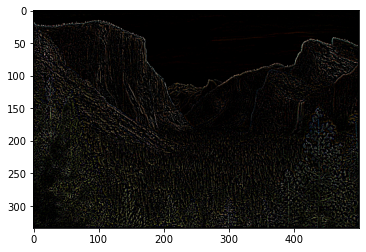

In [4]:
# #3
#remaking a separable gaussuaian filter that returns a filtered np image
def gauss(image, sigma):
    image = Image.open(image)
    image = np.asarray(image)
    
    filter_size = 2 * int(sigma * 4 + 0.5) + 1
    gauss_filter_x = np.zeros(filter_size, dtype=np.float32)
    gauss_filter_y = np.zeros(filter_size, dtype=np.float32)


    for i in range(filter_size):
        x = i - filter_size // 2
        gauss_filter_x[i] = 1.0 / np.sqrt((2 * np.pi * sigma ** 2)) * np.exp(-(x ** 2)/(2 * sigma ** 2))
    for j in range(filter_size):
        y = j - filter_size // 2
        gauss_filter_y[j] = 1.0 / np.sqrt((2 * np.pi * sigma ** 2)) * np.exp(-(y ** 2)/(2 * sigma ** 2))
    gauss_filter_x = np.expand_dims(gauss_filter_x, axis=0)  # or axis=1
    gauss_filter_y = np.expand_dims(gauss_filter_y, axis=1)  # or axis=1

    #plt.imshow(gauss_filter_y)
    
    im_filtered = np.zeros_like(image, dtype=np.float32)
    for c in range(3):
        im_filtered[:, :, c] = sc.ndimage.convolve(image[:, :, c], gauss_filter_x, mode='constant', cval=0)
    for c in range(3):
        im_filtered[:, :, c] = sc.ndimage.convolve(im_filtered[:, :, c], gauss_filter_y, mode='constant', cval=0) 
    return im_filtered

def SharpenImage(image, sigma, alpha):
    filtered = gauss(image, sigma)
    
    image = Image.open(image)
    image = np.asarray(image)
    
    #sharpned = alpha(gaussian - image)
    sharpened = np.multiply(alpha, (np.subtract(filtered, image)))
    plt.imshow(np.clip(sharpened, 0, 255).astype(np.uint8))
    
    fil = np.clip(sharpened, 0, 255).astype(np.uint8)
    image = Image.fromarray(fil)
    image.save('4.png')
    
    
SharpenImage('./hw1_data/Yosemite.png', 1, 5)

In [5]:
#4
def SobelImage(image):
    image = Image.open(image)
    image = np.asarray(image)
    #making image grey scale
    R, G, B = image[:,:,0], image[:,:,1], image[:,:,2]
    imgGray = 0.2989 * R + 0.5870 * G + 0.1140 * B
    #plt.imshow(imgGray, cmap='gray')
    
    #declaring my 3x3 Gy and Gx matrices
    gx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    gy = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], np.float32)
    #print(gx)
    #print(gy)
    #declaring 2 np arrays for the 2 seperate filteres (Gx, Gy)
    gx_filter = np.zeros_like(imgGray, dtype=np.float32)
    gy_filter = np.zeros_like(imgGray, dtype=np.float32)
    
    #filter here
    for c in range(2):
        gx_filter[:, :] = sc.ndimage.convolve(imgGray[:, :], gx, mode='constant', cval=0)
    for c in range(2):
        gy_filter[:, :] = sc.ndimage.convolve(imgGray[:, :], gy, mode='constant', cval=0) 
        
    #plt.imshow(np.clip(gy_filter, 0, 255).astype(np.uint8))
    
    #now compute the magnitude
    magnitude = np.zeros_like(imgGray, dtype=np.float32)
    for i in range(imgGray.shape[0]):
        for j in range(imgGray.shape[1]):
            #magnitude formula from slides
            magnitude[i, j] = np.sqrt((gx_filter[i,j]**2) + (gy_filter[i,j]**2))
    #plt.imshow(np.clip(magnitude, 0, 255).astype(np.uint8))
    fil = np.clip(magnitude, 0, 255).astype(np.uint8)
    image = Image.fromarray(fil)
    image.save('5a.png')
    
    #compute the oreintation
    theta = np.zeros_like(imgGray, dtype=np.float32)
    for i in range(imgGray.shape[0]):
        for j in range(imgGray.shape[1]):
            # theta = arctan(gy/gx)
            theta[i, j] = np.arctan2(gy_filter[i,j],gx_filter[i,j])
    #plt.imshow(np.clip(theta, 0, 255).astype(np.uint8))
    #color map
    cm = plt.get_cmap('gist_rainbow')
    colored_image = cm(theta)
    Image.fromarray((colored_image[:, :, :3] * 150).astype(np.uint8)).save('5b.png')
    

SobelImage('./hw1_data/LadyBug.jpg')

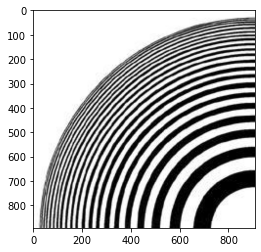

In [6]:
# #5 
def NearestNeighborInterpolation(image, x, y):
    #open image
    image = Image.open(image)
    image = np.asarray(image)
    #plt.imshow(np.clip(image, 0, 255).astype(np.uint8))
    #initialize output matrix
    output = np.zeros( (image.shape[0]*4,image.shape[1]*4, 3) )
    for j in range(len(output)):
        for i in range(len(output[j])):
            #scaling in this case .25 which is 4x
            proj_x = math.floor(i*x)
            proj_y = math.floor(j*y)
            output[j][i] = image[proj_y][proj_x] 
    plt.imshow(np.clip(output, 0, 255).astype(np.uint8))
    fil = np.clip(output, 0, 255).astype(np.uint8)
    image = Image.fromarray(fil)
    image.save('6a.png')
NearestNeighborInterpolation('./hw1_data/Moire_small.jpg', 0.25, 0.25)

x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0


x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0


x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0
x0 =  0


x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1


x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1
x0 =  1


x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2


x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2


x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2
x0 =  2


x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3


x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3


x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3
x0 =  3


x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4


x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4
x0 =  4


x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5


x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5


x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5
x0 =  5


x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6


x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6


x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6
x0 =  6


x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7


x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7


x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7
x0 =  7


x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8


x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8


x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8
x0 =  8


x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9


x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9
x0 =  9


x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x

x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x

x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x0 =  10
x

x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x

x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x

x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x0 =  11
x

x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x

x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x

x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x0 =  12
x

x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x

x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x0 =  13
x

x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x

x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x

x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x0 =  14
x

x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x

x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x

x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x0 =  15
x

x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x

x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x0 =  16
x

x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x

x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x

x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x0 =  17
x

x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x

x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x

x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x0 =  18
x

x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x

x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x0 =  19
x

x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x

x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x

x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x0 =  20
x

x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x

x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x0 =  21
x

x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x

x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x

x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x0 =  22
x

x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x

x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x

x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x0 =  23
x

x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x

x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x0 =  24
x

x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x

x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x

x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x0 =  25
x

x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x

x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x

x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x0 =  26
x

x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x

x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x

x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x0 =  27
x

x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x

x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x

x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x

x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  28
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x

x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x

x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x

x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x0 =  29
x

x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x

x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x

x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x0 =  30
x

x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x

x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x

x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x0 =  31
x

x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x

x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x

x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x

x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x0 =  32
x

x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x

x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x

x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x0 =  33
x

x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x

x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x

x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x0 =  34
x

x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x

x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x

x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x

x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  35
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x

x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x

x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x0 =  36
x

x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x

x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x

x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x

x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  37
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x

x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x

x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x0 =  38
x

x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x

x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x

x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x0 =  39
x

x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x

x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x

x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x

x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x0 =  40
x

x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x

x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x

x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x0 =  41
x

x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x

x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x

x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x

x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x0 =  42
x

x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x

x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x

x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x0 =  43
x

x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x

x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x0 =  44
x

x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x

x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x

x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x

x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x0 =  45
x

x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x

x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x

x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x0 =  46
x

x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x

x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x

x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x

x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  47
x0 =  48
x0 =  48
x0 =  48
x

x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x

x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x

x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x0 =  48
x

x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x

x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x

x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x0 =  49
x

x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x

x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x

x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x

x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x0 =  50
x

x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x

x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x

x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x0 =  51
x

x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x

x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x

x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x

x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x0 =  52
x

x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x

x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x

x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x0 =  53
x

x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x

x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x

x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x

x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x0 =  54
x

x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x

x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x

x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x0 =  55
x

x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x

x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x

x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x

x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  56
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x

x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x

x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x

x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x0 =  57
x

x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x

x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x

x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x0 =  58
x

x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x

x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x

x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x0 =  59
x

x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x

x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x

x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x

x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x0 =  60
x

x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x

x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x

x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x0 =  61
x

x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x

x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x0 =  62
x

x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x

x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x

x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x0 =  63
x

x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x

x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x

x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x0 =  64
x

x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x

x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x0 =  65
x

x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x

x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x

x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x0 =  66
x

x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x

x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x0 =  67
x

x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x

x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x

x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x0 =  68
x

x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x

x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x0 =  69
x

x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x

x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x

x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x0 =  70
x

x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x

x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x

x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  71
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x

x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x

x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x0 =  72
x

x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x

x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x

x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x0 =  73
x

x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x

x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x0 =  74
x

x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x

x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x

x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x0 =  75
x

x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x

x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x0 =  76
x

x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x

x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x

x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  77
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x

x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x

x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x0 =  78
x

x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x

x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x

x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x0 =  79
x

x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x

x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x0 =  80
x

x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x

x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x

x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x0 =  81
x

x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x

x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x

x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x0 =  82
x

x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x

x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x0 =  83
x

x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x

x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x

x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x0 =  84
x

x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x

x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x0 =  85
x

x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x

x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x

x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x0 =  86
x

x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x

x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x

x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  87
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x

x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x

x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x0 =  88
x

x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x

x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x

x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x0 =  89
x

x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x

x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x0 =  90
x

x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x

x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x

x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x0 =  91
x

x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x

x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x

x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  92
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x

x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x

x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x0 =  93
x

x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x

x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x

x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x0 =  94
x

x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x

x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x0 =  95
x

x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x

x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x

x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x0 =  96
x

x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x

x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x0 =  97
x

x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x

x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x

x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x0 =  98
x

x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x

x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x

x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x0 =  99
x

x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100


x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100
x0 =  100


x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101


x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101


x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101
x0 =  101


x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102


x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102
x0 =  102


x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103


x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103


x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103
x0 =  103


x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104


x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104
x0 =  104


x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105


x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105


x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105
x0 =  105


x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106


x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106


x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106
x0 =  106


x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107


x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107
x0 =  107


x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108


x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108


x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108
x0 =  108


x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109


x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109
x0 =  109


x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110


x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110


x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110
x0 =  110


x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111


x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111


x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111
x0 =  111


x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112


x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112
x0 =  112


x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113


x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113


x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113
x0 =  113


x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114


x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114


x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114
x0 =  114


x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115


x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115
x0 =  115


x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116


x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116


x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116
x0 =  116


x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117


x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117
x0 =  117


x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118


x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118


x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118
x0 =  118


x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119


x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119
x0 =  119


x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120


x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120


x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120
x0 =  120


x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121


x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121


x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  121
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122


x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122


x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122
x0 =  122


x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123


x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123


x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123
x0 =  123


x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124


x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124


x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124
x0 =  124


x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125


x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125
x0 =  125


x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126


x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126


x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126
x0 =  126


x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127


x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127
x0 =  127


x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128


x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128


x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128
x0 =  128


x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129


x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129
x0 =  129


x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130


x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130


x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130
x0 =  130


x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131


x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131


x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131
x0 =  131


x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132


x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132
x0 =  132


x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133


x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133


x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133
x0 =  133


x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134


x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134


x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134
x0 =  134


x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135


x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135


x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  135
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136


x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136


x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136
x0 =  136


x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137


x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137


x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137
x0 =  137


x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138


x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138


x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138
x0 =  138


x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139


x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139
x0 =  139


x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140


x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140


x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140
x0 =  140


x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141


x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141


x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141
x0 =  141


x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142


x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142
x0 =  142


x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143


x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143


x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143
x0 =  143


x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144


x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144


x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144
x0 =  144


x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145


x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145
x0 =  145


x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146


x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146


x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146
x0 =  146


x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147


x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147
x0 =  147


x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148


x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148


x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148
x0 =  148


x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149


x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149


x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149
x0 =  149


x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150


x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150
x0 =  150


x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151


x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151


x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151
x0 =  151


x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152


x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152


x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  152
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153


x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153


x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153
x0 =  153


x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154


x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154


x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154
x0 =  154


x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155


x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155
x0 =  155


x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156


x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156


x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156
x0 =  156


x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157


x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157


x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157
x0 =  157


x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158


x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158
x0 =  158


x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159


x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159


x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159
x0 =  159


x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160


x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160
x0 =  160


x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161


x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161


x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161
x0 =  161


x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162


x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  162


x0 =  162
x0 =  162
x0 =  162
x0 =  162
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163


x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163


x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163
x0 =  163


x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164


x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164


x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164
x0 =  164


x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165


x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165
x0 =  165


x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166


x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166


x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166
x0 =  166


x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167


x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167


x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167
x0 =  167


x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168


x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168
x0 =  168


x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169


x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169


x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169
x0 =  169


x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170


x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170


x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170
x0 =  170


x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171


x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171


x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  171
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172


x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172


x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172
x0 =  172


x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173


x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173


x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173
x0 =  173


x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174


x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174
x0 =  174


x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175


x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175


x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175
x0 =  175


x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176


x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176


x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176
x0 =  176


x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177


x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177
x0 =  177


x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178


x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178


x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178
x0 =  178


x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179


x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179


x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179
x0 =  179


x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180


x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180
x0 =  180


x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181


x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181


x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181
x0 =  181


x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182


x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182


x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  182
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183


x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183


x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183
x0 =  183


x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184


x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184


x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184
x0 =  184


x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185


x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185


x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185
x0 =  185


x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186


x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186
x0 =  186


x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187


x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187


x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187
x0 =  187


x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188


x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188


x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  188
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189


x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189


x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189
x0 =  189


x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190


x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190


x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190
x0 =  190


x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191


x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191
x0 =  191


x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192


x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192


x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192
x0 =  192


x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193


x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193


x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193
x0 =  193


x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194


x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194
x0 =  194


x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195


x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195


x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195
x0 =  195


x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196


x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196


x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  196
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197


x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197


x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197
x0 =  197


x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198


x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198


x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198
x0 =  198


x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199


x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199
x0 =  199


x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200


x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200


x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200
x0 =  200


x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201


x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201


x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201
x0 =  201


x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202


x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202
x0 =  202


x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203


x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203


x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203
x0 =  203


x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204


x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204


x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204
x0 =  204


x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205


x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205
x0 =  205


x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206


x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206


x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206
x0 =  206


x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207


x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207
x0 =  207


x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208


x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208


x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208
x0 =  208


x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209


x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209


x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209
x0 =  209


x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210


x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210
x0 =  210


x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211


x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211


x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211
x0 =  211


x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212


x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212


x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212
x0 =  212


x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213


x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213
x0 =  213


x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214


x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214


x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214
x0 =  214


x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215


x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215


x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215
x0 =  215


x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216


x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216
x0 =  216


x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217


x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217


x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217
x0 =  217


x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218


x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218
x0 =  218


x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219


x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219


x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219
x0 =  219


x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220


x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220
x0 =  220


x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221


x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221


x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221
x0 =  221


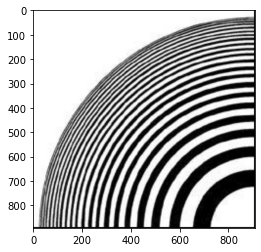

In [6]:
# #5
#this function for earch index evaluates the BilinearInterpolation
#we use this function at each pixel in the image to upcasle with less aliasing
def BI(x, y, points): #https://stackoverflow.com/questions/8661537/how-to-perform-bilinear-interpolation-in-python

    points = sorted(points)               # order points by x, then by y
    (x1, y1, q11), (_x1, y2, q12), (x2, _y1, q21), (_x2, _y2, q22) = points

    if x1 != _x1 or x2 != _x2 or y1 != _y1 or y2 != _y2:
        raise ValueError('points do not form a rectangle')
    if not x1 <= x <= x2 or not y1 <= y <= y2:
        raise ValueError('(x, y) not within the rectangle')

    return (q11 * (x2 - x) * (y2 - y) +
            q21 * (x - x1) * (y2 - y) +
            q12 * (x2 - x) * (y - y1) +
            q22 * (x - x1) * (y - y1)
           ) / ((x2 - x1) * (y2 - y1) + 0.0)


def BilinearInterpolation(image, x, y):
    image = Image.open(image)
    image = np.asarray(image)

    output = np.zeros( (image.shape[0]*4,image.shape[1]*4, 3) )
    #-4 because I was runing into some bound issues, and we are dividing by 4
    for i in range(output.shape[0]-4):
        for j in range(output.shape[1]-4):
            # these are the x/y cordinates 
            proj_x = (i*x)
            proj_y = (j*y)
            #math.floor is the lower bound
            x0 = math.floor(proj_x)
            y0 = math.floor(proj_y)
            #this function takes some time, print staement is basically a loading 
            print("x0 = ", x0)
            #this is the vector that gets pssed into BI x0/y0+1 is upper bound 
            n = [(x0, y0, image[x0][y0]),
                 (x0, y0+1, image[x0][y0+1]),
                 (x0+1, y0, image[x0+1,y0]),
                 (x0+1, y0+1, image[x0+1][y0+1]),
                ]
            output[i][j] = BI(proj_x,proj_y, n)
    plt.imshow(np.clip(output, 0, 255).astype(np.uint8))
    fil = np.clip(output, 0, 255).astype(np.uint8)
    image = Image.fromarray(fil)
    image.save('6b.png')

BilinearInterpolation('./hw1_data/Moire_small.jpg', 0.25, 0.25)

In [7]:
# written #4
OG_image = Image.open('./hw1_data/LadyBug.jpg')
rt_image = OG_image.rotate(40)
rt_image.show()
rt_20 = OG_image
for i in range(20):
    rt_20 = rt_20.rotate(2)
rt_20.show()